In [ ]:
# !sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.7 1
# !sudo update-alternatives --config python3
# !python3 -m pip install --upgrade pip

In [ ]:
# # when running this cell for first time it will show you a button to restart the runtime
# # or if the Requirement already satisfied move on to next cell

# !pip3 install opencv-contrib-python==3.4.2.17

In [1]:
import cv2
import imageio
import numpy as np
import matplotlib.pyplot as plt

In [2]:
feature_extractor = 'sift' # 'sift' OR 'surf'
feature_matching = 'bf'

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# unzip files
!unzip test-images.zip
!unzip "32-33/Stereo.zip" -d Stereo
!unzip "32-33/Temporal1.zip" -d Temporal1
!unzip "32-33/Temporal2.zip" -d Temporal2

Archive:  test-images.zip
 extracting: 32-33/Stereo.zip        
 extracting: 32-33/Temporal1.zip     
 extracting: 32-33/Temporal2.zip     
Archive:  32-33/Stereo.zip
  inflating: Stereo/A000685-1.bmp    
  inflating: Stereo/A000685-2.bmp    
Archive:  32-33/Temporal1.zip
  inflating: Temporal1/A003097-1.bmp  
  inflating: Temporal1/A003098-1.bmp  
  inflating: Temporal1/A003099-1.bmp  
  inflating: Temporal1/A003100-1.bmp  
Archive:  32-33/Temporal2.zip
  inflating: Temporal2/A000675-1.bmp  
  inflating: Temporal2/A000676-1.bmp  
  inflating: Temporal2/A000677-1.bmp  
  inflating: Temporal2/A000678-1.bmp  
  inflating: Temporal2/A000679-1.bmp  
  inflating: Temporal2/A000680-1.bmp  
  inflating: Temporal2/A000681-1.bmp  
  inflating: Temporal2/A000682-1.bmp  
  inflating: Temporal2/A000683-1.bmp  
  inflating: Temporal2/A000684-1.bmp  
  inflating: Temporal2/A000685-1.bmp  
  inflating: Temporal2/A000686-1.bmp  
  inflating: Temporal2/A000687-1.bmp  
  inflating: Temporal2/A000688-1.b

In [7]:
# path to the images
path = ""

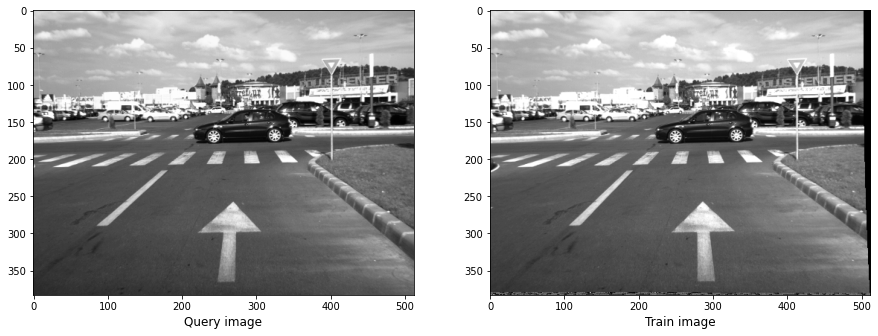

In [8]:
# you will change only the path of second and first image
# "Img2.jpg" , "Img1.jpg" , "Pic2.jpg" , "Pic1.jpg" , ...etc
 
trainImg = imageio.imread('/content/Stereo/A000685-1.bmp') # second imag
trainImg_gray = trainImg#cv2.cvtColor(trainImg, cv2.COLOR_RGB2GRAY)

queryImg = imageio.imread('/content/Stereo/A000685-2.bmp') # first image
queryImg_gray = queryImg#cv2.cvtColor(queryImg, cv2.COLOR_RGB2GRAY)

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(15,8))
ax1.imshow(queryImg, cmap="gray")
ax1.set_xlabel("Query image", fontsize=12)

ax2.imshow(trainImg, cmap="gray")
ax2.set_xlabel("Train image", fontsize=12)

plt.show()

In [9]:
def detectAndDescribe(image, method=None):
    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
        
    (kps, features) = descriptor.detectAndCompute(image, None)
    return (kps, features)

In [10]:
kpsA, featuresA = detectAndDescribe(trainImg_gray, method=feature_extractor)
kpsB, featuresB = detectAndDescribe(queryImg_gray, method=feature_extractor)

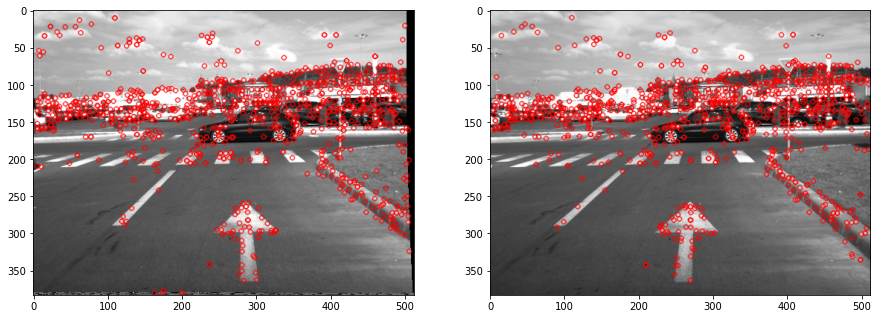

In [11]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(trainImg_gray,kpsA,None,color=(255,0,0)))
ax2.imshow(cv2.drawKeypoints(queryImg_gray,kpsB,None,color=(255,0,0)))

plt.show()

In [12]:
def createMatcher(method,crossCheck):
    if method == 'sift' or method == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    return bf

In [13]:
def matchKeyPointsBF(featuresA, featuresB, method):
    bf = createMatcher(method, crossCheck=True)
    best_matches = bf.match(featuresA,featuresB)
    rawMatches = sorted(best_matches, key = lambda x:x.distance)
    print("Raw matches:", len(rawMatches))
    return rawMatches

Raw matches: 641


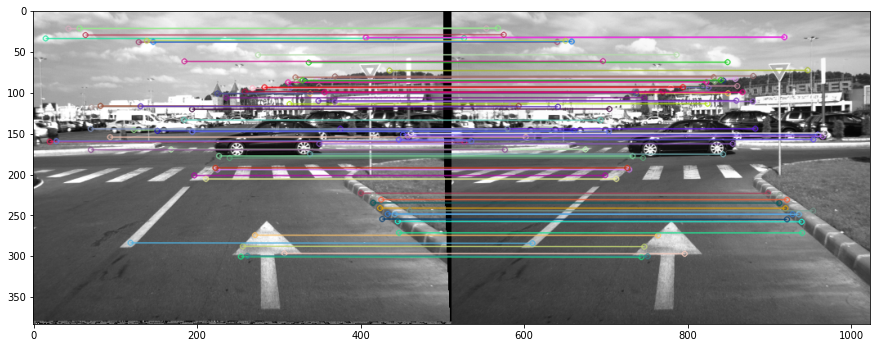

In [14]:
#huge# you can change the number in 'matches[:n]' based on the number of raw matches
fig = plt.figure(figsize=(15,8))
#hug
if feature_matching == 'bf':
    matches = matchKeyPointsBF(featuresA, featuresB, method=feature_extractor)
    img = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,matches[:80], 
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
plt.imshow(img)
plt.show()

# improving the tracking by using optical flow calculated with Lucas-Kanade algorithm

In [15]:
!pip install mediapy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 32.9 MB/s eta 0:00:00


In [16]:
import mediapy as media

In [17]:
#@title helper functions
def to_rgb(image):
  """
  convert a single channel image to 3 channels image (grey image)
  """
  return np.repeat(np.expand_dims(image,-1), 3, axis=2) 

def show_image(image, gray=False, size = 15):
  plt.figure(figsize=(size,size), dpi=80)
  if gray:
    plt.imshow(image, cmap="gray")
  else:
    plt.imshow(image)
  plt.show()

def detect_and_compute_features(image, method="sift"):
    """
    return pts:KeyPoint, features:numpy with shape(-1,128)
    """
    if method=="sift":
      descriptor = cv2.xfeatures2d.SIFT_create()
    else:
      descriptor = cv2.xfeatures2d.SURF_create()
    (kps, features) = descriptor.detectAndCompute(image, None,)
    return (kps, features)

def to_numpy_pts(keypoints):
  """
  convert list of KeyPoints to numpy array of point (shape: [-1,1,2]) 
  """
  return np.array([keypoint.pt for keypoint in keypoints]).reshape(-1, 1, 2).astype(np.float32)

def to_keypoints(numpy_points):
  """
  convert numpy array of point (shape: [-1,1,2]) to list of KeyPoints
  """
  return [cv2.KeyPoint(x=point[0][0], y=point[0][1], size=1) for point in numpy_points]

def compute_features_at_points(image, points, method="sift"):
    """
    pts = numpy array of points (-1,1,2) or list of keypoints
    return pts:KeyPoint, features:numpy with shape(-1,128)
    """
    if (type(points[0]) == np.ndarray):
      keypoints = to_keypoints(points)
    else:
      keypoints = points
    if method=="sift":
      descriptor = cv2.xfeatures2d.SIFT_create()
    else:
      descriptor = cv2.xfeatures2d.SURF_create()
    (kps, features) = descriptor.compute(image, keypoints)
    return (kps, features)


def draw_features(image,points, as_circles = False):
  if as_circles:
      if type(points[0]) == np.ndarray : 
          points = to_keypoints(points)
      img = cv2.drawKeypoints(image,points,None,color=(255,0,0))
  else:
      if type(points[0]) != np.ndarray : 
            points = to_numpy_pts(points)  
      img = to_rgb(image.copy())
      for i, point in enumerate(points):
        a, b = point.ravel()
        img = cv2.circle(img, (int(a), int(b)), 1, [255,0,0],-1)
  return img

def show_features(image,points, size = 15, as_circles = False):
  img = draw_features(image,points,as_circles)
  show_image(img, size = size)

def compute_optical_flow(previous_image,next_image,points):
  lk_params = dict(
      winSize = (20, 20),
      maxLevel = 2,
      criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,10, 0.03)
  )
  new_points, status, err = cv2.calcOpticalFlowPyrLK(previous_image,next_image, points, None, **lk_params)
  
  new_points = new_points[status == 1]
  points = points[status == 1]
  
  new_points = np.reshape(new_points, [-1,1,2])
  points = np.reshape(points, [-1,1,2])
  return (points, new_points)

def show_flow(img, points, new_points,size = 10, return_flow=False):
    if type(points[0])!= np.ndarray:
       points = to_numpy_pts(points)
    if type(new_points[0])!= np.ndarray:
       new_points = to_numpy_pts(new_points)
    image = to_rgb(img.copy())
    # draw the tracks
    for i, (new, old) in enumerate(zip(points, new_points)):
        a, b = new.ravel()
        c, d = old.ravel()
        image = cv2.line(image, (int(a), int(b)), (int(c),int(d)), [0,0,255], 1)
        image = cv2.circle(image, (int(a), int(b)), 1, [0,255,0],-1)        # color[i].tolist(), -1)
    
    if (return_flow):
        return image
    show_image(image,size=size)

def features_match(featuresA, featuresB, keep_only=None):
    """
    if keep_only = -1 we keep all the points otherwise we only keep the top "keep_only" points
    return list of brute force matches that are also the same point before and after the flow
    """
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(featuresA,featuresB)
    # keep only the best matches up to keep_only matche
    if (keep_only!=None):
      matches = sorted(matches, key = lambda x:x.distance)
      matches = matches[0:keep_only]
    # select only matches where the match cantain the same point (before and after the flow)
    matches = list(filter(lambda x: x.queryIdx == x.trainIdx, matches))

    # old = len(featuresA)
    # print("reduction:",old,len(matches))

    return matches

## Stereo

In [18]:
imageA = imageio.imread(path +'Stereo/A000685-1.bmp')
imageB = imageio.imread(path +'Stereo/A000685-2.bmp')
# show_image(imageB, gray=True)

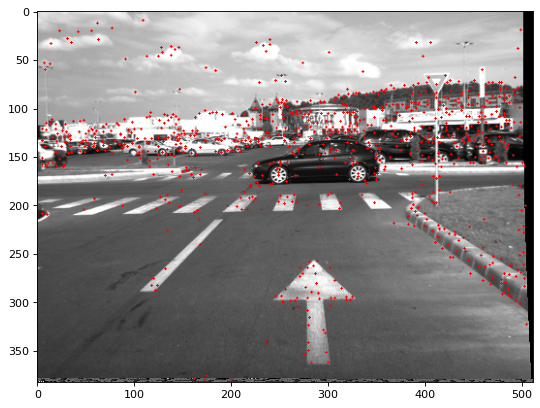

In [19]:
# detect and show features in image A
pointsA, featuresA = detect_and_compute_features(imageA)
show_features(imageA,pointsA,as_circles=False,size=8)

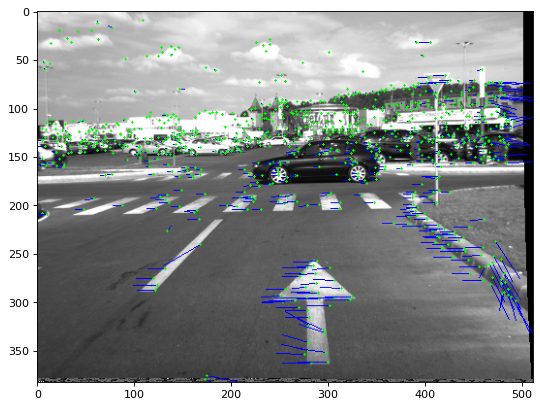

In [20]:
# compute and show optical flow of detected points
pointsA = to_numpy_pts(pointsA)
pointsA, pointsB = compute_optical_flow(imageA,imageB,pointsA)
# pointsA are the original detected points in imageA and pointsB are the translated pointsA in the next image (imageB)
show_flow(imageA,pointsA,pointsB,size=8)

In [21]:
# compute features at pointsA in imageA and at pointsB in imageB
pointsA, featuresA = compute_features_at_points(imageA, pointsA)
pointsB, featuresB = compute_features_at_points(imageB, pointsB)

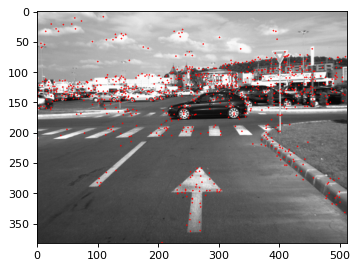

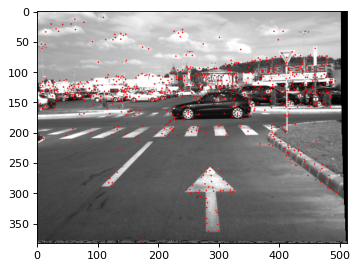

In [22]:
# show features in both images before and after the flow
show_features(imageB,pointsB, size=5)
show_features(imageA,pointsA, size=5)

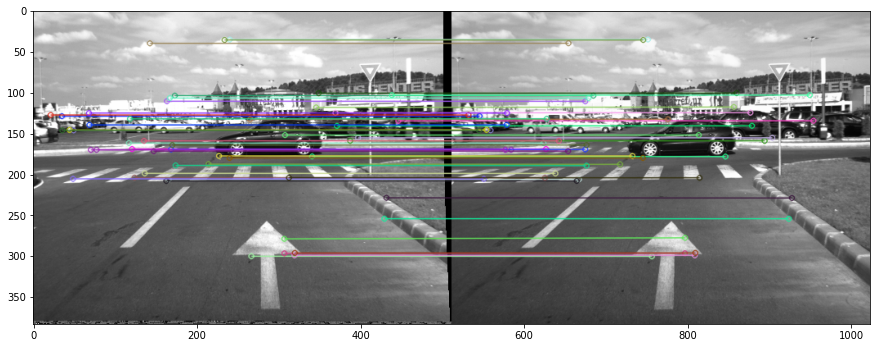

In [23]:
# match featuresA and featuresB and return only the matches where its the same point
matches = features_match(featuresA, featuresB, keep_only=-1) 
# show only 50 points 
img = cv2.drawMatches(imageA, pointsA, imageB, pointsB, matches[0:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)   
fig = plt.figure(figsize=(15,8))
plt.imshow(img)
plt.show()

optical flow of detected points using Lucas-Kanade algorithm (containing some wrong points that have non horizontal flow)


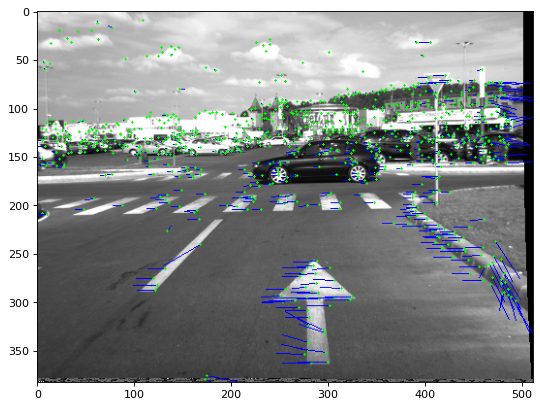

after the filtering, we only kept the good points and indeed most left vectors show up horizontally


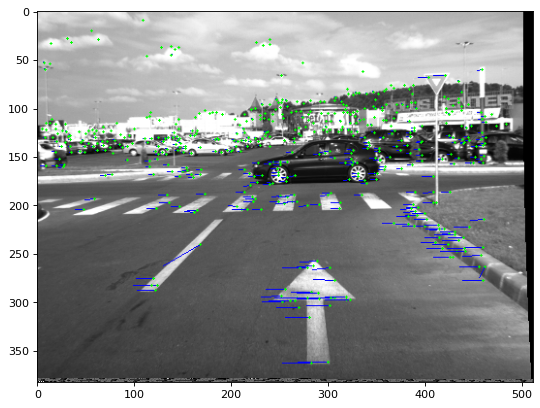

In [24]:
# show optical flow of the matches
ids = [mat.trainIdx for mat in matches]
pts = to_numpy_pts(pointsA)[ids]
a, b = compute_optical_flow(imageA,imageB,pts)

# show optical flow of all points for comparison
print("optical flow of detected points using Lucas-Kanade algorithm (containing some wrong points that have non horizontal flow)")
show_flow(imageA,pointsA,pointsB,size=8)

print("after the filtering, we only kept the good points and indeed most left vectors show up horizontally")
show_flow(imageA,a,b,size=8)

the reson why the fluxe vectors are not all horizontal) is because lukas-kanade is not perfect and sometimes miscalculates the fluxes of a point,
that's why we will use the BFmatcher later to remove the wrong points,
we will only keep the points where the starting point in the first image is the same point at the end of the fluxes in the second image

## Temporal1

In [25]:
# load images
images = []
images.append(imageio.imread(path + 'Temporal1/A003097-1.bmp'))
images.append(imageio.imread(path + 'Temporal1/A003098-1.bmp'))
images.append(imageio.imread(path + 'Temporal1/A003099-1.bmp'))
images.append(imageio.imread(path + 'Temporal1/A003100-1.bmp'))
N = 4

""

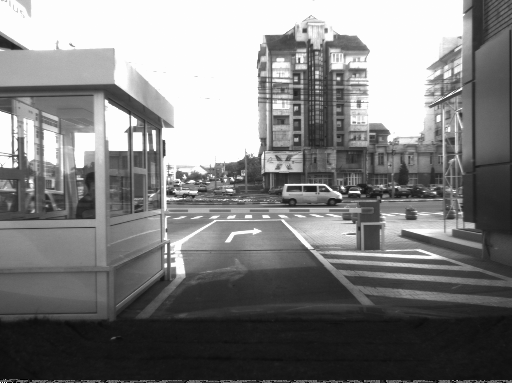

In [26]:
# display images as gif
media.show_video(images, height=400, fps=30, codec='gif')

""

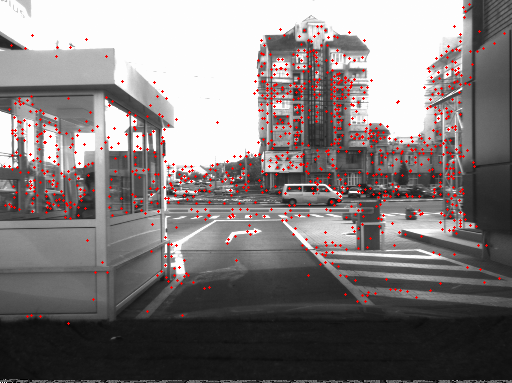


orical flow of points:



""

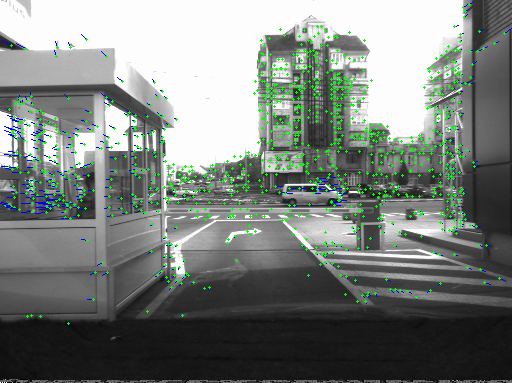

In [27]:
start = 0
# detect features in first image
points, _ = detect_and_compute_features(images[start])
points = to_numpy_pts(points)

frames=[]
frames2=[]
# draw features of first image
frame = draw_features(images[start], points,as_circles = False)
frames.append(frame)

for i in range(start+1,N):
    imageA = images[i-1]
    imageB = images[i]

    # compute the optical flow of detected points
    points, new_points = compute_optical_flow(imageA,imageB,points)

    frames2.append(show_flow(imageA, points, new_points, return_flow=True))

    # compute features at "points" in imageA and at "new_points" in imageB
    points, featuresA = compute_features_at_points(imageA, points)
    new_points, featuresB = compute_features_at_points(imageB, new_points)

    # match featuresA and featuresB and return only the matches where its the same point
    matches = features_match(featuresA, featuresB, keep_only=-1)   

    # selecting matched points only
    ids = [mat.trainIdx for mat in matches]
    new_points = to_numpy_pts(new_points)[ids]

    # draw current frame with reminding points
    frame = draw_features(imageB, new_points,as_circles = False)
    frames.append(frame)
    
    # for next frame we will use the new_points
    points = new_points

# display images as gif
media.show_video(frames, height=400, fps=4, codec='gif')
print("\norical flow of points:\n")
media.show_video(frames2, height=400, fps=3, codec='gif')

## Temporal2

In [28]:
# load images
N = 95-75+1 # lastindex - firstindex + 1
images = []
for i in range(75,75+N):
  images.append(imageio.imread(path +'Temporal2/A0006'+str(i)+'-1.bmp'))

# display images as gif
media.show_video(images, height=400, fps=30, codec='gif')

Output hidden; open in https://colab.research.google.com to view.

""

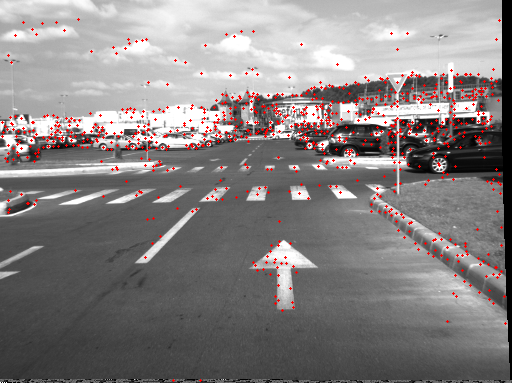


orical flow of points:



""

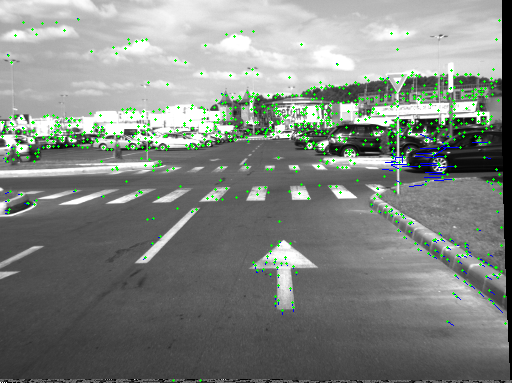

In [29]:
start = 0
# detect features in first image
points, _ = detect_and_compute_features(images[start])
points = to_numpy_pts(points)

frames=[]
frames2=[]
# draw features of first image
frame = draw_features(images[start], points,as_circles = False)
frames.append(frame)

for i in range(start+1,N):
    imageA = images[i-1]
    imageB = images[i]

    # compute the optical flow of detected points
    points, new_points = compute_optical_flow(imageA,imageB,points)

    frames2.append(show_flow(imageA, points, new_points, return_flow=True))

    # compute features at "points" in imageA and at "new_points" in imageB
    points, featuresA = compute_features_at_points(imageA, points)
    new_points, featuresB = compute_features_at_points(imageB, new_points)

    # match featuresA and featuresB and return only the matches where its the same point
    matches = features_match(featuresA, featuresB, keep_only=-1)   

    # selecting matched points only
    ids = [mat.trainIdx for mat in matches]
    new_points = to_numpy_pts(new_points)[ids]

    # draw current frame with reminding points
    frame = draw_features(imageB, new_points,as_circles = False)
    frames.append(frame)
    
    # for next frame we will use the new_points
    points = new_points

# display images as gif
media.show_video(frames, height=400, fps=4, codec='gif')
print("\norical flow of points:\n") 
media.show_video(frames2, height=400, fps=3, codec='gif')